In [1]:
import pandas as pd
import numpy as np

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib notebook

In [2]:
train9 = pd.read_csv('train/train9_enc.csv')
test9 = pd.read_csv('test/test9_enc.csv')
hero = pd.read_csv('train/encoded_hero_data.csv')

In [3]:
import time

In [3]:
train9.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id
0,1,1_74,304,185,3743.699732,0.092123,0.715667,0.001144,-0.393678,74.0
1,1,1_65,255,151,4009.021513,-0.345066,1.163758,0.539587,-0.801640,65.0
2,1,1_39,203,135,5094.621514,0.549268,0.607199,-0.197010,-0.806031,39.0
3,1,1_106,158,106,4619.212963,0.692378,0.137812,1.358986,-1.285956,106.0
4,1,1_2,157,94,2871.627907,-0.541217,0.310945,1.998080,-0.535615,2.0


In [4]:
test9.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id
0,3,3_65,330,183,3418.470419,-0.345066,1.163758,0.539587,-0.801640,65.0
1,3,3_104,231,107,2522.639069,0.108771,0.156566,1.714450,-0.877288,104.0
2,3,3_7,200,103,2793.255132,-0.382543,0.528829,1.699489,-1.361245,7.0
3,3,3_19,189,91,3493.495230,0.239576,0.291791,1.899761,-0.558694,19.0
4,3,3_4,182,102,3586.402266,-0.120895,0.349294,1.237462,-1.226181,4.0


In [6]:
hero.head()

,f1,f2,f3,f4,hero_id
0,0.916280,-0.440243,0.593328,-1.246173,1
1,-0.541217,0.310945,1.998080,-0.535615,2
2,-0.330326,1.480717,0.177098,-1.379168,3
3,-0.120895,0.349294,1.237462,-1.226181,4
4,-1.038609,1.257227,-0.118469,-0.693097,5


In [7]:
hero.shape

(115, 5)

In [8]:
hero['hero_id']

0        1
1        2
2        3
3        4
4        5
5        6
6        7
7        8
8        9
9       10
10      11
11      12
12      13
13      14
14      15
15      16
16      17
17      18
18      19
19      20
20      21
21      22
22      23
23      25
24      26
25      27
26      28
27      29
28      30
29      31
      ... 
85      87
86      88
87      89
88      90
89      91
90      92
91      93
92      94
93      95
94      96
95      97
96      98
97      99
98     100
99     101
100    102
101    103
102    104
103    105
104    106
105    107
106    108
107    109
108    110
109    111
110    112
111    113
112    114
113    119
114    120
Name: hero_id, Length: 115, dtype: int64

In [4]:
features = ['num_games', 'kda_ratio', 'f1', 'f2', 'f3', 'f4']

In [12]:
# 120 heroes * 7 features = 840 total features for ancoders

In [13]:
train9.shape

(18846, 10)

In [14]:
test9.shape

(8082, 10)

In [5]:
train9['hero_id'] = train9['hero_id'].astype(int)

In [6]:
test9['hero_id'] = test9['hero_id'].astype(int)

In [18]:
train9['user_id'].nunique()

2094

In [19]:
test9['user_id'].nunique()

898

In [21]:
# for ancoder input data size = 2992 * 805

In [4]:
all_data = train9.append(test9)

In [5]:
all_data.shape

(26928, 10)

In [6]:
all_data['user_id'].nunique()

2992

In [7]:
all_data['user_id'].min()

1

In [8]:
all_data['user_id'].max()

2992

In [15]:
all_data.isnull().sum()

user_id      0
id           0
num_games    0
num_wins     0
kda_ratio    0
f1           0
f2           0
f3           0
f4           0
hero_id      0
dtype: int64

In [9]:
all_data['num_games'] = (all_data['num_games'] - all_data['num_games'].mean()) / (all_data['num_games'].max() - all_data['num_games'].min())

In [10]:
all_data['kda_ratio'] = (all_data['kda_ratio'] - all_data['kda_ratio'].mean()) / (all_data['kda_ratio'].max() - all_data['kda_ratio'].min())

In [16]:
all_data.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id
0,1,1_74,0.015742,185,0.005627,0.092123,0.715667,0.001144,-0.393678,74.0
1,1,1_65,0.009011,151,0.012610,-0.345066,1.163758,0.539587,-0.801640,65.0
2,1,1_39,0.001867,135,0.041178,0.549268,0.607199,-0.197010,-0.806031,39.0
3,1,1_106,-0.004315,106,0.028667,0.692378,0.137812,1.358986,-1.285956,106.0
4,1,1_2,-0.004453,94,-0.017322,-0.541217,0.310945,1.998080,-0.535615,2.0


In [18]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26928 entries, 0 to 8081
Data columns (total 10 columns):
user_id      26928 non-null int64
id           26928 non-null object
num_games    26928 non-null float64
num_wins     26928 non-null int64
kda_ratio    26928 non-null float64
f1           26928 non-null float64
f2           26928 non-null float64
f3           26928 non-null float64
f4           26928 non-null float64
hero_id      26928 non-null float64
dtypes: float64(7), int64(2), object(1)
memory usage: 2.3+ MB


In [19]:
# making data for user encoding
t1 = time.time()
d = np.zeros((2992, 720))
for u_id in np.arange(1,2993):
    u_id = int(u_id)
    data = all_data[all_data['user_id'] == u_id]
    for i,row in data.iterrows():
        ind = int((row['hero_id'] * 6) - 6)
        d[u_id-1][ind] = row['num_games']
        d[u_id-1][ind+1] = row['kda_ratio']
        d[u_id-1][ind+2] = row['f1']
        d[u_id-1][ind+3] = row['f2']
        d[u_id-1][ind+4] = row['f3']
        d[u_id-1][ind+5] = row['f4']

t2 = time.time()
print(t2-t1)

6.6874330043792725


In [20]:
d[0][435:445]

array([ 0.        ,  0.        ,  0.        ,  0.01574222,  0.0056275 ,
        0.0921234 ,  0.71566685,  0.00114378, -0.39367762,  0.        ])

In [21]:
all_data[all_data['user_id'] == 1]

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id
0,1,1_74,0.015742,185,0.005627,0.092123,0.715667,0.001144,-0.393678,74.0
1,1,1_65,0.009011,151,0.012610,-0.345066,1.163758,0.539587,-0.801640,65.0
2,1,1_39,0.001867,135,0.041178,0.549268,0.607199,-0.197010,-0.806031,39.0
3,1,1_106,-0.004315,106,0.028667,0.692378,0.137812,1.358986,-1.285956,106.0
4,1,1_2,-0.004453,94,-0.017322,-0.541217,0.310945,1.998080,-0.535615,2.0
5,1,1_46,-0.004865,103,0.000092,0.588362,0.054556,-0.155839,-1.023071,46.0
6,1,1_51,-0.008437,78,0.002787,0.041905,0.246695,1.649885,-1.144765,51.0
7,1,1_17,-0.009811,75,0.005344,0.101181,0.996774,0.582990,-0.750440,17.0
8,1,1_69,-0.010086,65,-0.001382,-0.097242,-0.048898,1.717760,-0.646150,69.0


In [22]:
for_anc_data = pd.DataFrame(d)

In [23]:
for_anc_data.head()

,0,1,2,3,4,5,6,7,8,9,...,710,711,712,713,714,715,716,717,718,719
0,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,-0.004453,-0.017322,-0.541217,0.310945,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.00695,0.039536,0.91628,-0.440243,0.593328,-1.246173,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [21]:
for_anc_data.shape

(2992, 720)

In [25]:
for_anc_data.isnull().sum().sum()

0

In [65]:
for_anc_data.to_csv('train/user_enc_data.csv', index=False, encoding='utf-8')

In [3]:
for_anc_data = pd.read_csv('train/user_enc_data.csv')

In [24]:
d.shape

(2992, 720)

In [25]:
from keras.models import Model
from keras.layers import Dense, Input
from keras.regularizers import l1
from keras.optimizers import Adam
from keras.optimizers import sgd

C:\Users\admin\Anaconda3\lib\site-packages\h5py\__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [26]:
d.shape

(2992, 720)

In [27]:
input_size = 720
hidden_size = 128
code_size = 24

input_user = Input(shape=(input_size,))
hidden_1 = Dense(hidden_size, activation='relu')(input_user)
code = Dense(code_size, activation='relu')(hidden_1)
hidden_2 = Dense(hidden_size, activation='relu')(code)
output_user = Dense(input_size, activation='linear')(hidden_2)

autoencoder = Model(input_user, output_user)
autoencoder.compile(optimizer='sgd', loss='mean_squared_error')
t1 = time.time()
autoencoder.fit(d, d, epochs=500, verbose=0)
t2 = time.time()

In [28]:
t2-t1

315.6595139503479

In [29]:
x = autoencoder.predict(d)

In [31]:
autoencoder.evaluate(d,d)

2880/2992 [===========================>..] - ETA: 0s

0.030444768063206087

In [32]:
W1 = autoencoder.get_weights()[0]
b1 = autoencoder.get_weights()[1]
W2 = autoencoder.get_weights()[2]
b2 = autoencoder.get_weights()[3]

In [33]:
encoded_players = np.dot((np.dot(d, W1) + b1),W2) + b2

In [34]:
encoded_players.shape

(2992, 24)

In [35]:
train9 = pd.read_csv('train/train9_enc.csv')
train1 = pd.read_csv('train/train1_enc.csv')
test9 = pd.read_csv('test/test9_enc.csv')
test1 = pd.read_csv('test/test1_enc.csv')

In [36]:
def make_enc_user_data(df, rows):
    user_add = pd.DataFrame(index= np.arange(0, rows), columns=np.arange(0, 24))
    i = 0
    for r in df['user_id']:
        user_add.loc[i] = encoded_players[r-1]
        i = i + 1
    return user_add

In [37]:
t9 = make_enc_user_data(train9, train9.shape[0])
t1 = make_enc_user_data(train1, train1.shape[0])
te9 = make_enc_user_data(test9, test9.shape[0])
te1 = make_enc_user_data(test1, test1.shape[0])

In [50]:
train9.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id
0,1,1_74,304,185,3743.699732,0.092123,0.715667,0.001144,-0.393678,74.0
1,1,1_65,255,151,4009.021513,-0.345066,1.163758,0.539587,-0.801640,65.0
2,1,1_39,203,135,5094.621514,0.549268,0.607199,-0.197010,-0.806031,39.0
3,1,1_106,158,106,4619.212963,0.692378,0.137812,1.358986,-1.285956,106.0
4,1,1_2,157,94,2871.627907,-0.541217,0.310945,1.998080,-0.535615,2.0


In [38]:
train9 = train9.join(t9)
train1 = train1.join(t1)
test9 = test9.join(te9)
test1 = test1.join(te1)

In [39]:
train9.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id,...,14,15,16,17,18,19,20,21,22,23
0,1,1_74,304,185,3743.699732,0.092123,0.715667,0.001144,-0.393678,74.0,...,-0.543285,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953
1,1,1_65,255,151,4009.021513,-0.345066,1.163758,0.539587,-0.801640,65.0,...,-0.543285,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953
2,1,1_39,203,135,5094.621514,0.549268,0.607199,-0.197010,-0.806031,39.0,...,-0.543285,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953
3,1,1_106,158,106,4619.212963,0.692378,0.137812,1.358986,-1.285956,106.0,...,-0.543285,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953
4,1,1_2,157,94,2871.627907,-0.541217,0.310945,1.998080,-0.535615,2.0,...,-0.543285,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953


In [57]:
#all_data = train9.append(train1)
#all_data = all_data.append(test9)

In [50]:
# dict models 
train_user_models = {}
target_name = 'kda_ratio'
features1 = ['f1', 'f2', 'f3', 'f4']

In [41]:
from sklearn.linear_model import ElasticNetCV

In [46]:
all_data.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id
0,1,1_74,0.015742,185,0.005627,0.092123,0.715667,0.001144,-0.393678,74.0
1,1,1_65,0.009011,151,0.012610,-0.345066,1.163758,0.539587,-0.801640,65.0
2,1,1_39,0.001867,135,0.041178,0.549268,0.607199,-0.197010,-0.806031,39.0
3,1,1_106,-0.004315,106,0.028667,0.692378,0.137812,1.358986,-1.285956,106.0
4,1,1_2,-0.004453,94,-0.017322,-0.541217,0.310945,1.998080,-0.535615,2.0


In [48]:
train9.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id,...,14,15,16,17,18,19,20,21,22,23
0,1,1_74,304,185,3743.699732,0.092123,0.715667,0.001144,-0.393678,74.0,...,-0.543285,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953
1,1,1_65,255,151,4009.021513,-0.345066,1.163758,0.539587,-0.801640,65.0,...,-0.543285,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953
2,1,1_39,203,135,5094.621514,0.549268,0.607199,-0.197010,-0.806031,39.0,...,-0.543285,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953
3,1,1_106,158,106,4619.212963,0.692378,0.137812,1.358986,-1.285956,106.0,...,-0.543285,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953
4,1,1_2,157,94,2871.627907,-0.541217,0.310945,1.998080,-0.535615,2.0,...,-0.543285,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953


In [49]:
personalized_data = train9.append(test9)

In [51]:
# linear regression
for u_id in personalized_data['user_id'].unique():
    data = personalized_data[personalized_data['user_id'] == u_id]
    train_user_models[u_id] = ElasticNetCV(normalize=True, max_iter=5000)
    train_user_models[u_id].fit(data[features1], data[target_name])

In [52]:
# linear regression for all data
ans_personalized_data = []
for index,row in personalized_data.iterrows():
    u_id = row['user_id']
    ans_personalized_data.append(train_user_models[u_id].predict(row[features1])[0])

C:\Users\admin\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\admin\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\admin\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarn

In [53]:
personalized_data['pers_pred'] = ans_personalized_data

In [54]:
# linear regression for all data
ans_train1 = []
for index,row in train1.iterrows():
    u_id = row['user_id']
    ans_train1.append(train_user_models[u_id].predict(row[features1])[0])

C:\Users\admin\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\admin\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\admin\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarn

In [55]:
train1['pers_pred'] = ans_train1

In [56]:
train1.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id,...,15,16,17,18,19,20,21,22,23,pers_pred
0,1,1_41,201,125,3731.707317,0.261733,-0.025571,1.917332,-0.984914,41.0,...,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953,3788.238368
1,2,2_17,427,234,2922.058381,0.101181,0.996774,0.582990,-0.750440,17.0,...,0.378211,0.101136,-0.210105,-0.291036,-0.245622,-0.304305,-0.430997,-0.362351,0.206126,2858.125209
2,5,5_106,240,130,5116.682739,0.692378,0.137812,1.358986,-1.285956,106.0,...,0.261002,0.335483,0.00322684,0.405841,-0.305476,-0.0920402,-0.404988,-0.365086,0.0624195,4194.043231
3,6,6_65,206,122,4131.553861,-0.345066,1.163758,0.539587,-0.801640,65.0,...,0.0243737,-0.124169,-0.0308482,0.0279878,-0.452325,0.00885263,0.127515,-0.514576,-0.296816,3886.190698
4,7,7_69,697,382,2474.469306,-0.097242,-0.048898,1.717760,-0.646150,69.0,...,-0.112665,-0.025748,-0.616389,0.349453,0.0458159,-0.458116,-0.317511,0.477948,-0.134413,3063.610008


In [75]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
import math

In [58]:
# error in personaized data
math.sqrt(mean_squared_error(personalized_data['kda_ratio'], personalized_data['pers_pred']))

721.1638756613505

In [59]:
# error in train1 data
math.sqrt(mean_squared_error(train1['kda_ratio'], train1['pers_pred']))

759.0768434316525

In [60]:
personalized_data.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id,...,15,16,17,18,19,20,21,22,23,pers_pred
0,1,1_74,304,185,3743.699732,0.092123,0.715667,0.001144,-0.393678,74.0,...,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953,3850.487831
1,1,1_65,255,151,4009.021513,-0.345066,1.163758,0.539587,-0.801640,65.0,...,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953,3830.380940
2,1,1_39,203,135,5094.621514,0.549268,0.607199,-0.197010,-0.806031,39.0,...,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953,4070.471559
3,1,1_106,158,106,4619.212963,0.692378,0.137812,1.358986,-1.285956,106.0,...,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953,4036.183599
4,1,1_2,157,94,2871.627907,-0.541217,0.310945,1.998080,-0.535615,2.0,...,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953,3502.059108


In [61]:
train1.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id,...,15,16,17,18,19,20,21,22,23,pers_pred
0,1,1_41,201,125,3731.707317,0.261733,-0.025571,1.917332,-0.984914,41.0,...,0.0112899,0.0877944,-0.435937,0.0703005,-0.119459,-0.550893,0.159662,-0.170213,0.078953,3788.238368
1,2,2_17,427,234,2922.058381,0.101181,0.996774,0.582990,-0.750440,17.0,...,0.378211,0.101136,-0.210105,-0.291036,-0.245622,-0.304305,-0.430997,-0.362351,0.206126,2858.125209
2,5,5_106,240,130,5116.682739,0.692378,0.137812,1.358986,-1.285956,106.0,...,0.261002,0.335483,0.00322684,0.405841,-0.305476,-0.0920402,-0.404988,-0.365086,0.0624195,4194.043231
3,6,6_65,206,122,4131.553861,-0.345066,1.163758,0.539587,-0.801640,65.0,...,0.0243737,-0.124169,-0.0308482,0.0279878,-0.452325,0.00885263,0.127515,-0.514576,-0.296816,3886.190698
4,7,7_69,697,382,2474.469306,-0.097242,-0.048898,1.717760,-0.646150,69.0,...,-0.112665,-0.025748,-0.616389,0.349453,0.0458159,-0.458116,-0.317511,0.477948,-0.134413,3063.610008


In [62]:
import xgboost as xgb

C:\Users\admin\Anaconda3\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [83]:
features2 = [i for i in personalized_data.columns if i not in ['user_id', 'hero_id', 'id', 'num_wins', 'kda_ratio']]

In [66]:
len(features2)

30

In [69]:
print(features2)

['num_games', 'f1', 'f2', 'f3', 'f4', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 'pers_pred']


In [73]:
for col in features2:
    personalized_data[col]  = personalized_data[col].astype(float)
    train1[col] = train1[col].astype(float)

In [74]:
train1.head()

,user_id,id,num_games,num_wins,kda_ratio,f1,f2,f3,f4,hero_id,...,15,16,17,18,19,20,21,22,23,pers_pred
0,1,1_41,201.0,125,3731.707317,0.261733,-0.025571,1.917332,-0.984914,41.0,...,0.011290,0.087794,-0.435937,0.070300,-0.119459,-0.550893,0.159662,-0.170213,0.078953,3788.238368
1,2,2_17,427.0,234,2922.058381,0.101181,0.996774,0.582990,-0.750440,17.0,...,0.378211,0.101136,-0.210105,-0.291036,-0.245622,-0.304305,-0.430997,-0.362351,0.206126,2858.125209
2,5,5_106,240.0,130,5116.682739,0.692378,0.137812,1.358986,-1.285956,106.0,...,0.261002,0.335483,0.003227,0.405841,-0.305476,-0.092040,-0.404988,-0.365086,0.062419,4194.043231
3,6,6_65,206.0,122,4131.553861,-0.345066,1.163758,0.539587,-0.801640,65.0,...,0.024374,-0.124169,-0.030848,0.027988,-0.452325,0.008853,0.127515,-0.514576,-0.296816,3886.190698
4,7,7_69,697.0,382,2474.469306,-0.097242,-0.048898,1.717760,-0.646150,69.0,...,-0.112665,-0.025748,-0.616389,0.349453,0.045816,-0.458116,-0.317511,0.477948,-0.134413,3063.610008


In [84]:
attr = ['kda_ratio']

In [86]:
attr.extend(features2)

In [90]:
print(attr)

['kda_ratio', 'num_games', 'f1', 'f2', 'f3', 'f4', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 'pers_pred']


In [88]:
corr = personalized_data[attr].corr()

<IPython.core.display.Javascript object>


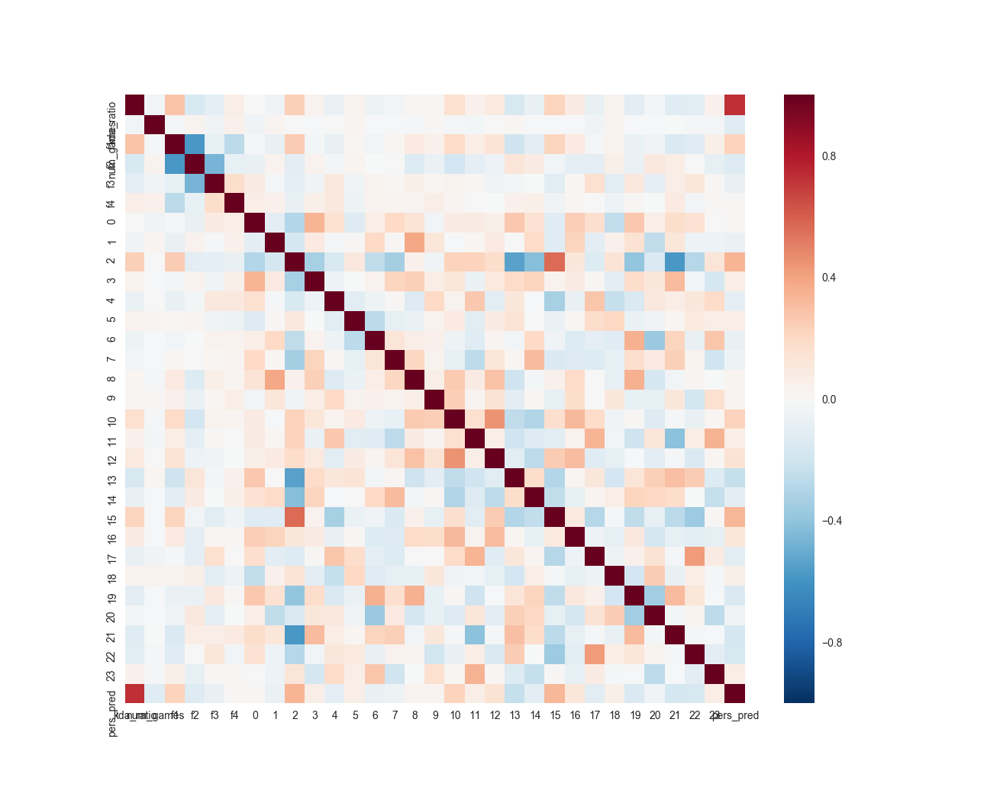

In [89]:
sns.heatmap(corr)

In [97]:
def modelfitxgb(model, train_data, train_label, predictors, eval_metric, useTrainCV=True, cv_folds=10, early_stopping_rounds=100):

    if useTrainCV:
        xgb_param = model.get_xgb_params()
        params = {
            'objective': xgb_param['objective'],
            'base_score': xgb_param['base_score'],
            'colsample_bylevel': xgb_param['colsample_bylevel'],
            'colsample_bytree': xgb_param['colsample_bytree'],
            'gamma': xgb_param['gamma'],
            'eta': xgb_param['learning_rate'],
            'max_delta_step': xgb_param['max_delta_step'],
            'max_depth': xgb_param['max_depth'],
            'min_child_weight': xgb_param['min_child_weight'],
            'alpha': xgb_param['reg_alpha'],
            'lambda': xgb_param['reg_lambda'],
            'scale_pos_weight': xgb_param['scale_pos_weight'],
            'subsample': xgb_param['subsample']
        }

        dtrain = xgb.DMatrix(data=train_data[predictors], label=train_label)
        cvresult = xgb.cv(params, dtrain, num_boost_round=model.get_params()['n_estimators'],  nfold=cv_folds, metrics=eval_metric, early_stopping_rounds=early_stopping_rounds)
        model.set_params(n_estimators=cvresult.shape[0])
        # print(cvresult)
        print("########### n_estimators = %f" % cvresult.shape[0])

    # Fit the algorithm on the data
    model.fit(train_data[predictors], train_label, eval_metric=eval_metric)
    
    # Predict training set:
    train_pred = model.predict(train_data[predictors])
    
    # predict training probablities
    #train_proba = model.predict(train_data[predictors])
    
    # Print model report:
    print("\nModel Report")
    print("RMSE (Train): %.5g" % math.sqrt(mean_squared_error(train_label, train_pred)))
    #print("ROC AUC (Train): %.5g" % roc_auc_score(train_label, train_proba))

    feat_imp = pd.Series(model.booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')
    plt.show()
    return model

In [92]:
clf1 = xgb.XGBRegressor(objective='reg:linear', learning_rate=0.1, max_depth=4, n_estimators=1000, subsample=0.8, colsample_bytree=0.8, gamma=0.1, min_child_weight=1, reg_alpha=0.001)

########### n_estimators = 212.000000

Model Report
RMSE (Train): 477.87


<IPython.core.display.Javascript object>


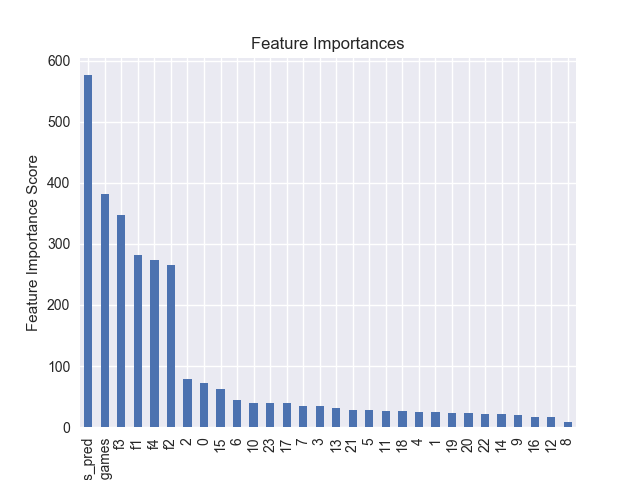

In [98]:
clf1 = modelfitxgb(clf1, personalized_data, personalized_data[target_name], features2, 'rmse')

In [101]:
feature3 = ['pers_pred', 'num_games', 'f3', 'f1', 'f4', 'f2', 2, 0, 15, 6, 10, 23, 17, 7, 3]

In [100]:
clf2 = xgb.XGBRegressor(objective='reg:linear', learning_rate=0.1, max_depth=4, n_estimators=212, subsample=0.8, colsample_bytree=0.8, gamma=0.1, min_child_weight=1, reg_alpha=0.001)


Model Report
RMSE (Train): 480.73


<IPython.core.display.Javascript object>


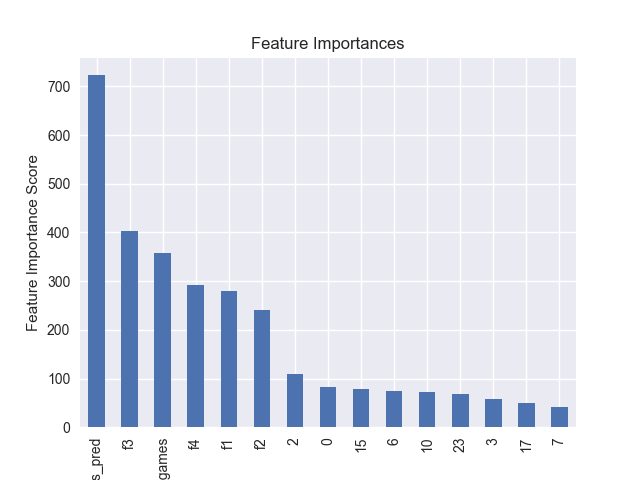

In [102]:
clf2 = modelfitxgb(clf2, personalized_data, personalized_data[target_name], feature3, 'rmse', useTrainCV=False)

In [103]:
personalized_data.to_csv('personalized_data.csv', index=False, encoding='utf-8')

In [104]:
train1.to_csv('train1_as_test.csv', index=False, encoding='utf-8')

In [ ]:
pred_test = clf.predict(test1[features2])
test1['final_pred'] = pred_test
test1[['id', 'final_pred']].to_csv('sub.csv', index=False, encoding='utf-8')